In [7]:
import os
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Function to read text file contents
def read_text_file(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        text = file.read()
    return text

# Path to the folder containing train data, test data, and test data solutions
folder_path = r"C:\Users\komat\Downloads\archive (5)\Genre Classification Dataset"

In [8]:

import pandas as pd
import numpy as np

In [9]:
# DEFINE COLUMN NAMES FOR THE DATASETS
columns = [ 'Movie Name' , 'Genre' , 'Description']
column = ['Movie Name' , 'Description']

In [17]:
# READ THE TRAINING DATA FROM 'train_data.txt' WITH A CUSTOM DELIMITER ':::'
df_train = pd.read_csv(r"C:\Users\komat\Downloads\archive (5)\Genre Classification Dataset\train_data.txt", delimiter=':::', engine='python', names=columns, index_col=0)

# DISPLAY THE FIRST FEW ROWS OF THE TRAINING DATASET
df_train.head()

,Movie Name,Genre,Description
1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [18]:
# READ THE TEST DATA FROM 'test_data_solution.txt' WITH A CUSTOM DELIMITER ':::'
df_test = pd.read_csv(r"C:\Users\komat\Downloads\archive (5)\Genre Classification Dataset\test_data.txt", delimiter=':::' , engine='python' , names=columns , index_col=0 )

# DISPLAY THE FIRST FEW ROWS OF THE TEST DATASET
df_test.head()

,Genre,Description
Movie Name,,
1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
5,Er nu zhai (1955),Before he was known internationally as a mart...


In [19]:
# CONVERT THE 'DESCRIPTION' COLUMN TO LOWERCASE IN BOTH TRAINING AND TEST DATASETS
df_train.loc[:,'Description'] = df_train['Description'].astype(str).str.lower()
df_test.loc[:,'Description'] = df_test['Description'].astype(str).str.lower()

In [24]:
# DISPLAY THE FIRST FEW ROWS OF THE MODIFIED TRAINING DATASET



df_train.head()

,Genre,Description
1,drama,listening in to a conversation between his do...
2,thriller,a brother and sister with a past incestuous r...
3,adult,as the bus empties the students for their fie...
4,drama,to help their unemployed father make ends mee...
5,drama,the film's title refers not only to the un-re...


In [25]:
# READ THE TEST DATA FROM 'test_data_solution.txt' WITH A CUSTOM DELIMITER ':::'
df_test = pd.read_csv(r"C:\Users\komat\Downloads\archive (5)\Genre Classification Dataset\test_data.txt", delimiter=':::' , engine='python' , names=columns , index_col=0 )

# DISPLAY THE FIRST FEW ROWS OF THE TEST DATASET
df_test.head()

,Genre,Description
Movie Name,,
1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
5,Er nu zhai (1955),Before he was known internationally as a mart...


In [26]:



# DISPLAY THE FIRST FEW ROWS OF THE MODIFIED TEST DATASET
df_test.head()

,Genre,Description
Movie Name,,
1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
5,Er nu zhai (1955),Before he was known internationally as a mart...


In [27]:
# DISPLAY INFORMATION ABOUT THE TRAINING DATASET
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Index: 54214 entries, 1 to 54214
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Genre        54214 non-null  object
 1   Description  54214 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB
None


In [28]:
# DISPLAY INFORMATION ABOUT THE TEST DATASET
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 54200 entries, 1 to 54200
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Genre        54200 non-null  object
 1   Description  54200 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB
None


In [29]:
# DISPLAY THE SHAPE (NUMBER OF ROWS AND COLUMNS) OF THE TRAINING DATASET
print(df_train.shape)

(54214, 2)


In [30]:
# DISPLAY THE SHAPE (NUMBER OF ROWS AND COLUMNS) OF THE TEST DATASET
print(df_test.shape)

(54200, 2)


In [31]:
# CHECK FOR DUPLICATE ROWS IN THE TRAINING DATASET
print("TRAINING DUPLICATES:", df_train.duplicated().sum())

TRAINING DUPLICATES: 110


In [32]:
# CHECK FOR DUPLICATE ROWS IN THE TEST DATASET
print("TEST DUPLICATES:", df_test.duplicated().sum())

TEST DUPLICATES: 0


In [33]:
# DROP DUPLICATE ROWS FROM THE TRAINING DATASET
df_train = df_train.drop_duplicates(keep ='first')

# DROP DUPLICATE ROWS FROM THE TEST DATASET
df_test = df_test.drop_duplicates(keep = 'first')

In [34]:
# VERIFY NO DUPLICATES REMAIN IN THE TRAINING DATASET
print("TRAINING DUPLICATES AFTER REMOVAL:", df_train.duplicated().sum())

# VERIFY NO DUPLICATES REMAIN IN THE TEST DATASET
print("TEST DUPLICATES AFTER REMOVAL:", df_test.duplicated().sum())

TRAINING DUPLICATES AFTER REMOVAL: 0
TEST DUPLICATES AFTER REMOVAL: 0


In [35]:
# DISPLAY THE SHAPE OF THE TRAINING DATASET AFTER REMOVING DUPLICATES
print(df_train.shape)

# DISPLAY THE SHAPE OF THE TEST DATASET AFTER REMOVING DUPLICATES

print(df_test.shape)

(54104, 2)
(54200, 2)


In [36]:
# SEPARATE FEATURES AND LABELS FOR TRAINING AND TEST DATASETS
x_train_full = df_train['Description']
y_train_full = df_train['Genre']

x_test = df_test['Description']
y_test = df_test['Genre']

In [37]:
# DISPLAY THE SHAPES OF THE FEATURE AND LABEL ARRAYS FOR THE TRAINING DATASET
print(x_train_full.shape)
print(y_train_full.shape)

(54104,)
(54104,)


In [38]:
# DISPLAY THE SHAPES OF THE FEATURE AND LABEL ARRAYS FOR THE TEST DATASET
print(x_test.shape)
print(y_test.shape)

(54200,)
(54200,)


C:\Users\komat\AppData\Local\Temp\ipykernel_15288\3755845081.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Genre' , data=df_train , order=df_train['Genre'].value_counts().index ,palette='viridis')


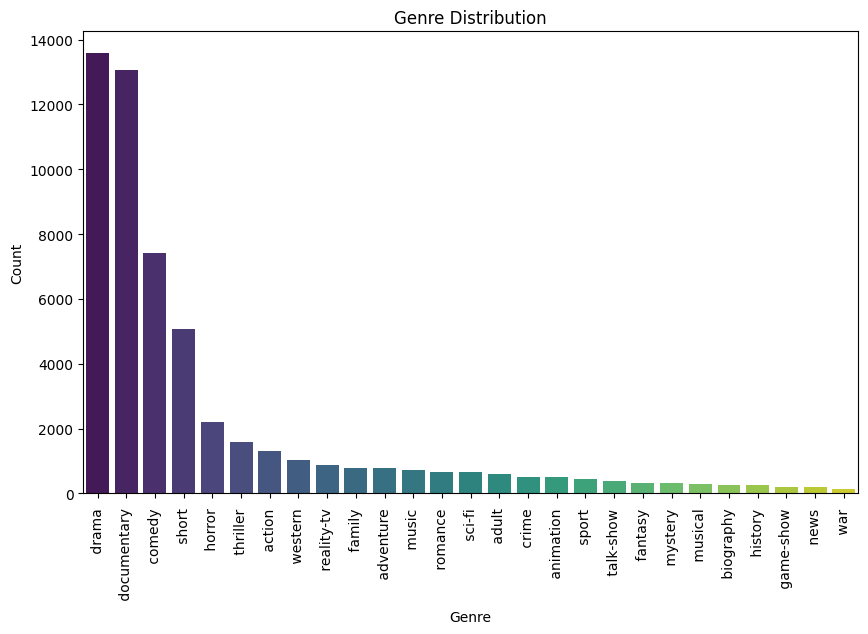

In [39]:
# IMPORTING VISUALIZATION LIBRARIES
import seaborn as sns
import matplotlib.pyplot as plt

# PLOT THE DISTRIBUTION OF GENRES IN THE TRAINING DATASET
plt.figure(figsize=(10,6))
sns.countplot(x='Genre' , data=df_train , order=df_train['Genre'].value_counts().index ,palette='viridis')
plt.title('Genre Distribution')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [40]:
# IMPORTING train_test_split FROM sklearn TO SPLIT THE DATA
from sklearn.model_selection import train_test_split

# SPLIT THE TRAINING DATA INTO TRAINING AND VALIDATION SETS
X_train , X_val , Y_train , Y_val = train_test_split(x_train_full , y_train_full , test_size=0.2 , random_state=42)

In [41]:
# DISPLAY THE SHAPES OF THE TRAINING , VALIDATION AND TEST FEATURE SETS
print(X_train.shape)
print(X_val.shape)
print(x_test.shape)

print('\n')

# DISPLAY THE SHAPES OF THE TRAINING , VALIDATION AND TEST LABEL SETS
print(Y_train.shape)
print(Y_val.shape)

print(y_test.shape)

(43283,)
(10821,)
(54200,)


(43283,)
(10821,)
(54200,)


In [42]:
# IMPORT TfidfVectorizer FROM sklearn FOR FEATURE EXTRACTION
from sklearn.feature_extraction.text import TfidfVectorizer

# INITIALIZE TF-IDF VECTORIZER
tfidf = TfidfVectorizer(stop_words ='english' , max_features=5000)

# FIT AND TRANSFORM THE TRAINING FEATURES, AND TRANSFORM THE VALIDATION AND TEST FEATURES
X_train_vec = tfidf.fit_transform(X_train)
X_val_vec = tfidf.transform(X_val)
X_test_vec = tfidf.transform(x_test)

In [43]:
# IMPORT MULTINOMIAL NAIVE BAYES CLASSIFIER FROM sklearn
from sklearn.naive_bayes import MultinomialNB

# TRAIN THE MULTINOMIAL NAIVE BAYES CLASSIFIER
nb = MultinomialNB()
nb.fit(X_train_vec, Y_train)

MultinomialNB()

In [44]:
# MAKE PREDICTIONS ON THE VALIDATION SET
y_pred_val = nb.predict(X_val_vec)

In [45]:
# IMPORT EVALUATION METRICS FROM sklearn
from sklearn.metrics import accuracy_score, classification_report

# EVALUATE THE MODEL ON THE VALIDATION SET
accuracy_val = accuracy_score(Y_val, y_pred_val)
print("Validation Accuracy:", accuracy_val)
print("Validation Classification Report:")
print(classification_report(Y_val, y_pred_val, zero_division=0))

Validation Accuracy: 0.5261990573884114
Validation Classification Report:
               precision    recall  f1-score   support

      action        0.52      0.06      0.11       271
       adult        0.50      0.03      0.06       118
   adventure        0.64      0.06      0.12       141
   animation        0.00      0.00      0.00        84
   biography        0.00      0.00      0.00        54
      comedy        0.51      0.44      0.47      1445
       crime        0.00      0.00      0.00        88
 documentary        0.59      0.89      0.71      2685
       drama        0.46      0.83      0.59      2720
      family        0.00      0.00      0.00       145
     fantasy        0.00      0.00      0.00        57
   game-show        1.00      0.20      0.33        40
     history        0.00      0.00      0.00        52
      horror        0.71      0.34      0.46       429
       music        0.93      0.09      0.17       148
     musical        0.00      0.00      0.00 

In [46]:
# MAKE PREDICTIONS ON THE TEST SET
y_pred_test = nb.predict(X_test_vec)

# EVALUATE THE MODEL ON THE TEST SET
accuracy_test = accuracy_score(y_test, y_pred_test)
print("\nTest Accuracy:", accuracy_test)
print("Test Classification Report:")
print(classification_report(y_test, y_pred_test, zero_division=0))


Test Accuracy: 0.0
Test Classification Report:
                                                                                                                                             precision    recall  f1-score   support

                                                                                                                          "#Elmira" (2014)        0.00      0.00      0.00       1.0
                                                                                                                 "#HoodDocumentary" (2016)        0.00      0.00      0.00       1.0
                                                                                                                   "#MonologueWars" (2014)        0.00      0.00      0.00       1.0
                                                                                                                    "#NotMadMonday" (2015)        0.00      0.00      0.00       1.0
                                              